In [ ]:
import os

In [ ]:
import glob


In [ ]:
from IPython.display import Image, display

In [ ]:
!nvidia-smi


Mon Mar 25 21:45:17 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
cd StopSignDetection

/content/StopSignDetection


In [ ]:
HOME=os.getcwd()
print(HOME)

/content/StopSignDetection


In [ ]:
!pip install ultralytics==8.0.0

In [ ]:
import ultralytics

In [ ]:
ultralytics.checks()

Ultralytics YOLOv8.0.0 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 28.9/78.2 GB disk)


In [ ]:
print(HOME)

/content/StopSignDetection


In [ ]:
!mkdir {HOME}/datasets

mkdir: cannot create directory ‘/content/StopSignDetection/datasets’: File exists


In [ ]:
%cd {HOME}/datasets

/content/StopSignDetection/datasets


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="RefRxsIfBuvbBQIY739C")
project = rf.workspace("custom-yolo-f8uj0").project("stop-ldjm4")
version = project.version(1)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


In [ ]:
!ls

stop-1


In [ ]:
print(HOME)

/content/StopSignDetection


In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data='/content/StopSignDetection/datasets/stop_1/data.yaml' epochs=100 imgsz=640

/content/StopSignDetection
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/StopSignDetection/datasets/stop_1/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, retina_masks=False, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, workspace=4, nms=False, lr0=0.01, lrf=0.01, momentum=0.937, weight

In [ ]:
!ls {HOME}/runs/detect/train3/

args.yaml					    R_curve.png		train_batch541.jpg
confusion_matrix.png				    results.csv		train_batch542.jpg
events.out.tfevents.1711404741.54200a681a50.8419.0  results.png		val_batch0_labels.jpg
F1_curve.png					    train_batch0.jpg	val_batch0_pred.jpg
P_curve.png					    train_batch1.jpg	weights
PR_curve.png					    train_batch2.jpg
predictions.json				    train_batch540.jpg


Printing Confusion Matrix

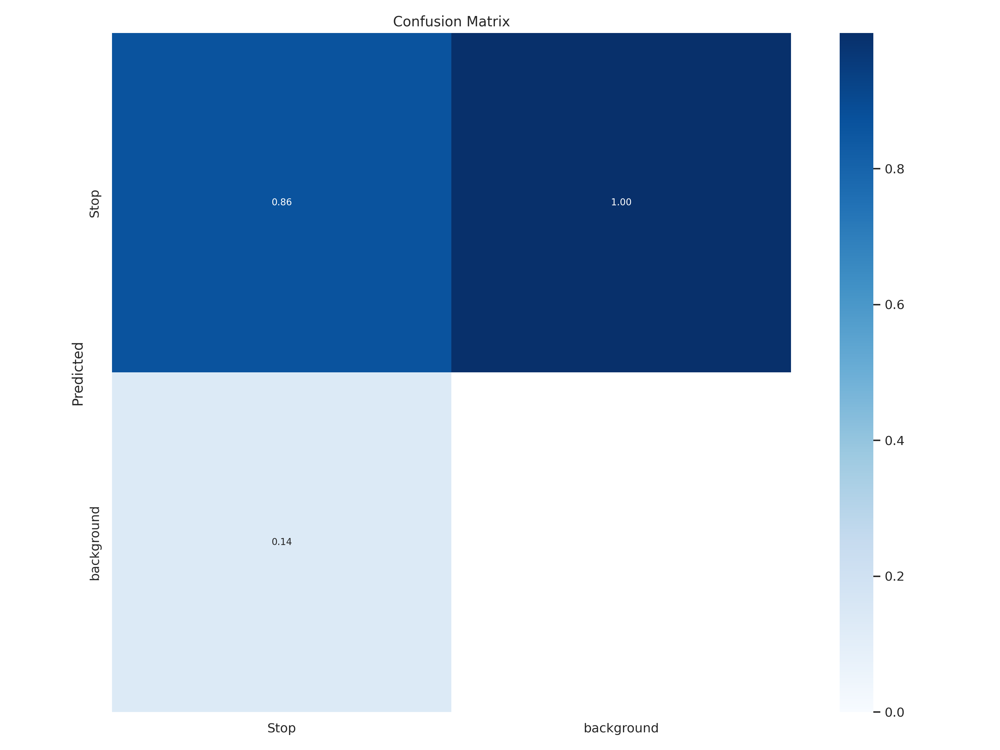

In [ ]:
from IPython.display import Image
Image(filename='/content/StopSignDetection/runs/detect/train3/confusion_matrix.png')

Checking Model Prediction on Validation Batch

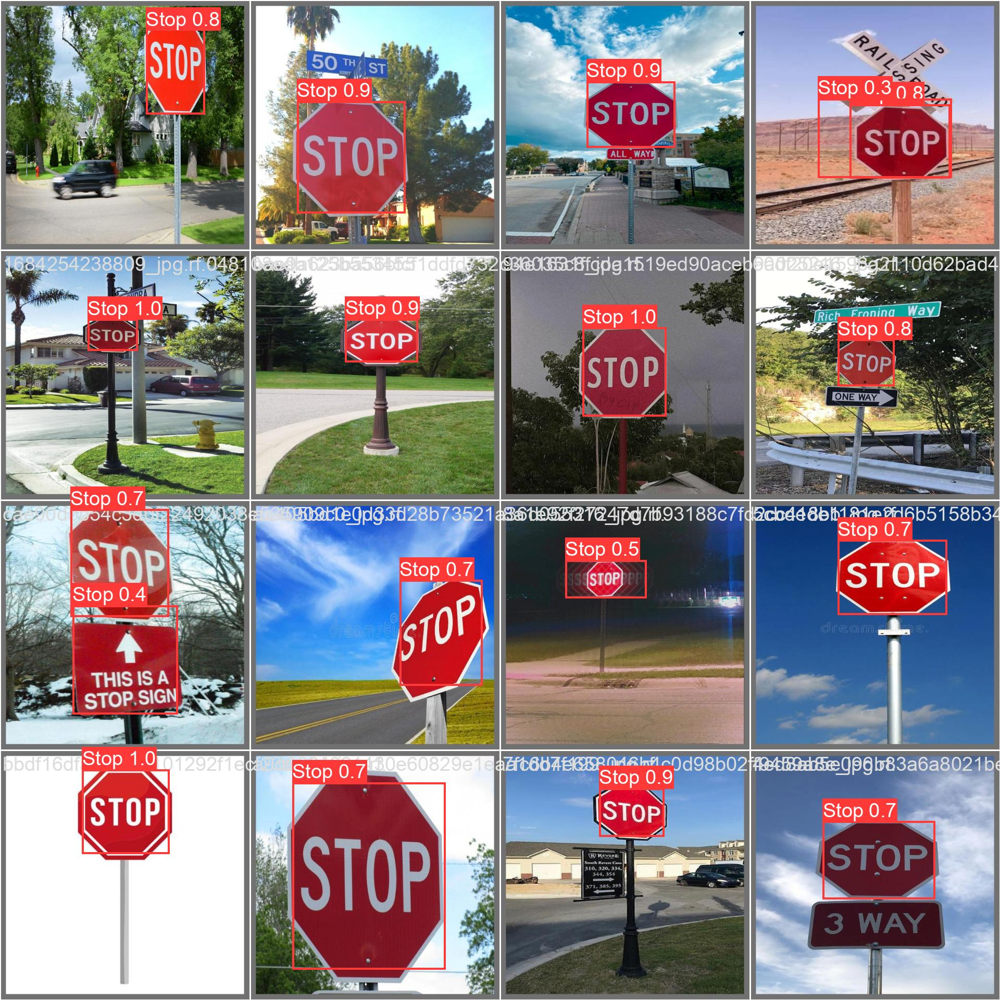

In [ ]:
Image(filename="/content/StopSignDetection/runs/detect/train3/val_batch0_pred.jpg", height=500)

Printing Training and Validation losses

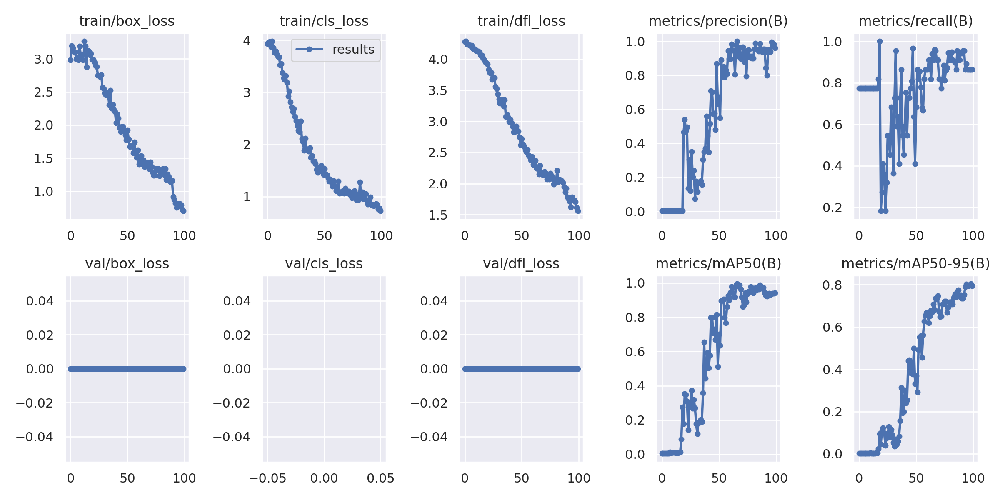

In [ ]:
Image(filename="/content/StopSignDetection/runs/detect/train3/results.png", width=600)

Validate Custom Model

In [ ]:
!yolo task=detect mode=val model="/content/StopSignDetection/runs/detect/train3/weights/best.pt" data="/content/StopSignDetection/datasets/stop_1/data.yaml"

2024-03-25 23:14:49.653762: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-25 23:14:49.653818: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-25 23:14:49.655838: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-25 23:14:51.527475: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.0 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Fusing layers... 
Model summary: 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/StopSignDetection/datasets/stop_1/valid/l

In [ ]:
!mv /content/stopsign_video1.mp4 /content/StopSignDetection

In [ ]:
!mv /content/stopsign_video2.mp4 /content/StopSignDetection

In [ ]:
!mv /content/stopsign_video3.mp4 /content/StopSignDetection

mv: cannot stat '/content/stopsign_video3.mp4': No such file or directory


Running the Predict.py script

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model="/content/StopSignDetection/runs/detect/train3/weights/best.pt" conf=0.25 source="stopsign_video1.mp4"

/content/StopSignDetection
2024-03-25 23:49:58.213693: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-25 23:49:58.213744: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-25 23:49:58.215469: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-25 23:49:59.447237: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.0 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Fusing layers... 
Model summary: 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
video 1/1 (1/327) /content/StopSignDe

Display Output Demo Video

In [ ]:
!rm "/content/StopSignDetection/stopsign_video1.mp4"

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

#input of video path:
save_path="/content/StopSignDetection/runs/detect/predict/stopsign_video1.mp4"

#compressing the video path:
compressed_path="/content/StopSignDetection/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

#showing the video:
mp4=open(compressed_path, 'rb').read()
data_url="data:video/mp4;base64,"+b64encode(mp4).decode()
HTML("""
<video width=400 controls>
  <source src="%s" type="video/mp4">
</video>
""" % data_url)